
# Color Image Processing

**Topic:** Color fundamentals, color models, pseudocolor processing, full-color image processing, transformations, color slicing, histogram processing, smoothing, sharpening, segmentation, edge detection, and noise.

**Learning outcomes**

By the end of this lab, students should be able to:

1. Load and inspect RGB color images.
2. Separate and visualise color channels.
3. Convert between RGB, CMY, HSV/HSI-like representations, and grayscale.
4. Apply pseudocolor maps to grayscale images.
5. Perform color transformations such as brightness/intensity scaling and color complements.
6. Implement color slicing and simple color segmentation.
7. Compare histogram processing in RGB and intensity-based spaces.
8. Apply smoothing, sharpening, edge detection, and noise simulation to color images.
9. Answer short conceptual questions and complete practical coding tasks.

---

## 0. Setup

Run the cell below first.  
The lab uses standard Python scientific libraries and sample images from `scikit-image`.

If a package is missing, install it in your environment using:

```python
!pip install numpy matplotlib scikit-image scipy
```

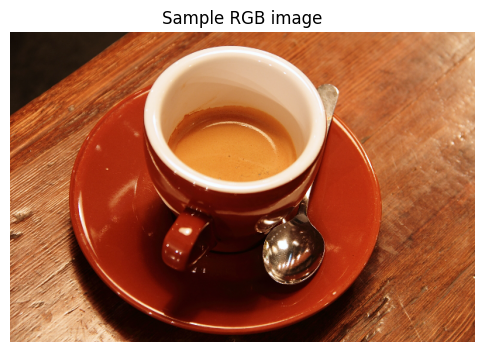

In [1]:
import numpy as np
import matplotlib.pyplot as plt

from skimage import data, img_as_float
from skimage.color import rgb2gray, rgb2hsv, hsv2rgb
from skimage import exposure, filters, util
from scipy import ndimage as ndi

plt.rcParams["figure.figsize"] = (12, 5)
plt.rcParams["image.cmap"] = "gray"

def show_image(img, title="", cmap=None):
    plt.figure(figsize=(6, 5))
    plt.imshow(np.clip(img, 0, 1), cmap=cmap)
    plt.title(title)
    plt.axis("off")
    plt.show()

def show_images(images, titles=None, cmap=None, figsize=(15, 5)):
    n = len(images)
    if titles is None:
        titles = [""] * n
    plt.figure(figsize=figsize)
    for i, (img, title) in enumerate(zip(images, titles), start=1):
        plt.subplot(1, n, i)
        plt.imshow(np.clip(img, 0, 1), cmap=cmap)
        plt.title(title)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

# Load sample RGB images
img = img_as_float(data.astronaut())
coffee = img_as_float(data.coffee())

show_image(coffee, "Sample RGB image")

## 1. RGB Color Model

In RGB images, each pixel is represented by three components:

- **R**: red intensity
- **G**: green intensity
- **B**: blue intensity

A color pixel can be interpreted as a vector:

$$
c(x,y) = [R(x,y), G(x,y), B(x,y)]
$$

### Task 1

1. Display the red, green, and blue channels separately.
2. Explain which channel contains the strongest facial/skin information in the sample image.
3. Replace one channel with zeros and observe how the image changes.

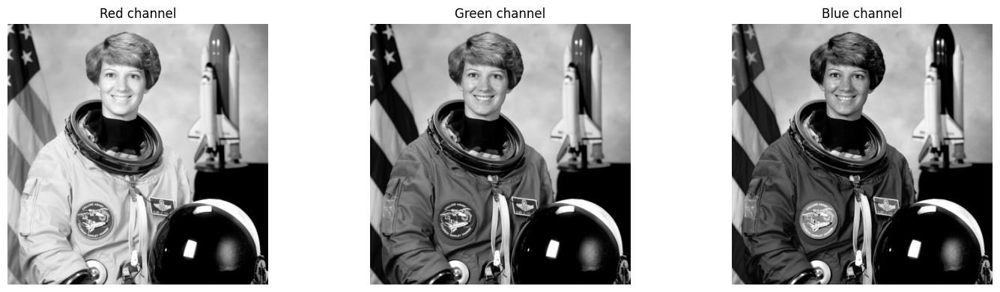

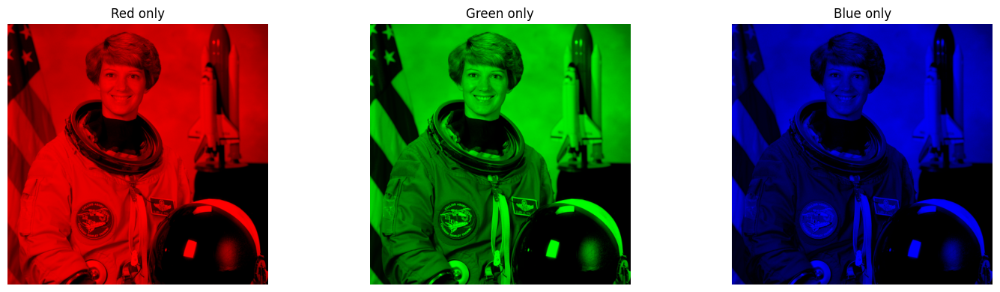

In [2]:
R = img[:, :, 0]
G = img[:, :, 1]
B = img[:, :, 2]

show_images(
    [R, G, B],
    ["Red channel", "Green channel", "Blue channel"],
    cmap="gray",
    figsize=(15, 4)
)

# Reconstruct images using one channel at a time
red_only = np.zeros_like(img)
green_only = np.zeros_like(img)
blue_only = np.zeros_like(img)

red_only[:, :, 0] = R
green_only[:, :, 1] = G
blue_only[:, :, 2] = B

show_images(
    [red_only, green_only, blue_only],
    ["Red only", "Green only", "Blue only"],
    figsize=(15, 4)
)

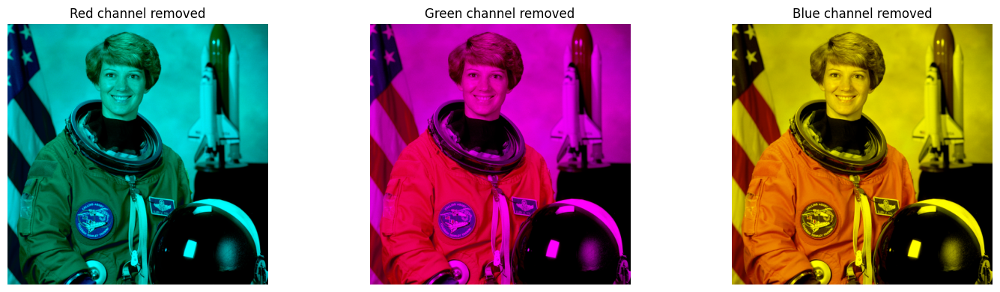

In [3]:
# Student experiment: remove one channel at a time
no_red = img.copy()
no_green = img.copy()
no_blue = img.copy()

no_red[:, :, 0] = 0
no_green[:, :, 1] = 0
no_blue[:, :, 2] = 0

show_images(
    [no_red, no_green, no_blue],
    ["Red channel removed", "Green channel removed", "Blue channel removed"],
    figsize=(15, 4)
)

### Questions

1. Why does removing the red channel strongly affect skin tones?
2. What happens when all three RGB values are equal at a pixel?
3. Which image regions have relatively high blue-channel intensity?

## 2. RGB to CMY Conversion

The CMY model is commonly linked with pigments and printing.  
For an RGB image normalised to the range \([0,1]\), conversion is:

$$
C = 1 - R, \quad M = 1 - G, \quad Y = 1 - B
$$

### Task 2

1. Convert the RGB image to CMY.
2. Display the cyan, magenta, and yellow components.
3. Convert CMY back to RGB and check reconstruction quality.

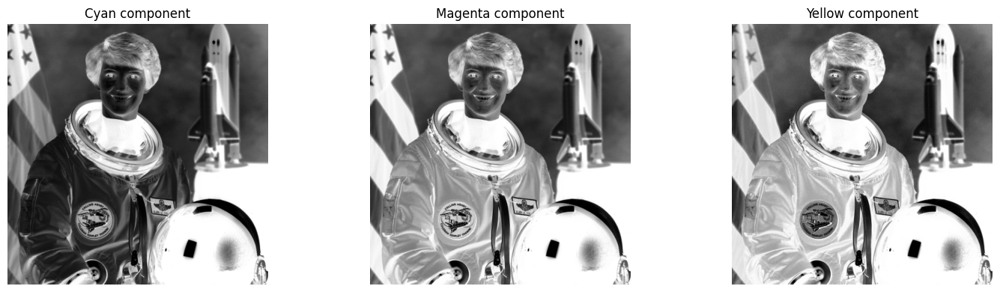

Maximum reconstruction error: 5.551115123125783e-17


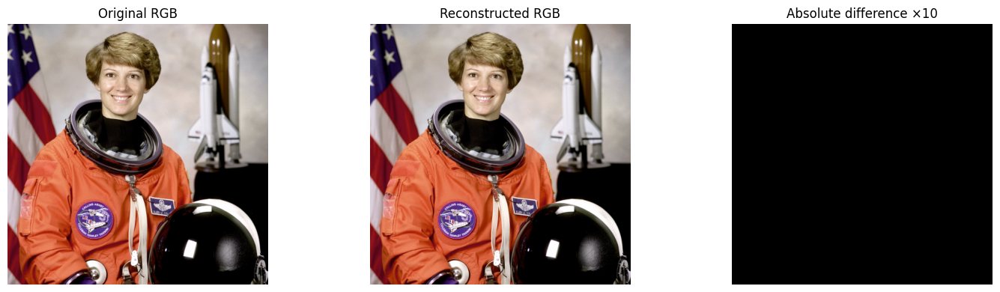

In [4]:
CMY = 1 - img
C, M, Y = CMY[:, :, 0], CMY[:, :, 1], CMY[:, :, 2]

show_images(
    [C, M, Y],
    ["Cyan component", "Magenta component", "Yellow component"],
    cmap="gray",
    figsize=(15, 4)
)

# Convert back to RGB
reconstructed_rgb = 1 - CMY

difference = np.abs(img - reconstructed_rgb)
print("Maximum reconstruction error:", difference.max())

show_images(
    [img, reconstructed_rgb, difference * 10],
    ["Original RGB", "Reconstructed RGB", "Absolute difference ×10"],
    figsize=(15, 4)
)

### Mini-task

Write a function called `rgb_to_cmy(image)` and another function called `cmy_to_rgb(image)`.

Then test them using the sample image.

In [5]:
# TODO: Complete these functions

def rgb_to_cmy(image):
    # Your code here
    return 1 - image

def cmy_to_rgb(cmy_image):
    # Your code here
    return 1 - cmy_image

test_cmy = rgb_to_cmy(img)
test_rgb = cmy_to_rgb(test_cmy)

print("Mean absolute error:", np.mean(np.abs(img - test_rgb)))

Mean absolute error: 1.0105650102855572e-17


## 3. HSV / HSI-like Color Representation

The lecture discusses HSI because it separates:

- **Hue**: dominant color
- **Saturation**: color purity
- **Intensity**: brightness-like component

Python libraries often provide HSV rather than exact HSI. HSV is still useful for teaching because it separates color information from value/brightness.

### Task 3

1. Convert RGB to HSV.
2. Display hue, saturation, and value.
3. Modify only the value component and compare it with modifying RGB channels directly.

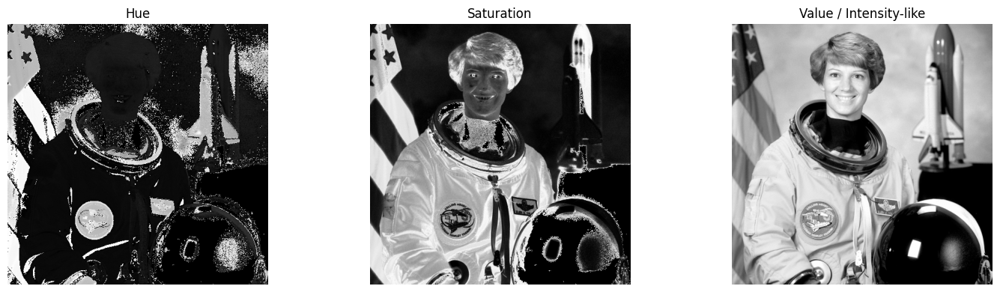

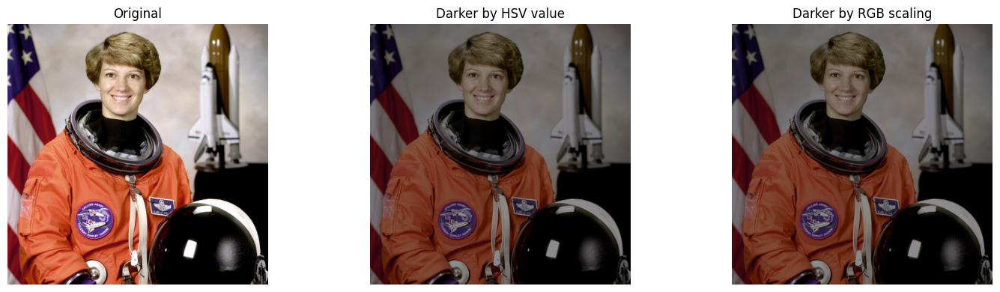

In [6]:
hsv = rgb2hsv(img)

H = hsv[:, :, 0]
S = hsv[:, :, 1]
V = hsv[:, :, 2]

show_images(
    [H, S, V],
    ["Hue", "Saturation", "Value / Intensity-like"],
    cmap="gray",
    figsize=(15, 4)
)

# Reduce brightness using HSV value channel
k = 0.55
hsv_darker = hsv.copy()
hsv_darker[:, :, 2] = k * hsv_darker[:, :, 2]
rgb_from_hsv_darker = hsv2rgb(hsv_darker)

# Reduce brightness directly in RGB
rgb_darker = k * img

show_images(
    [img, rgb_from_hsv_darker, rgb_darker],
    ["Original", "Darker by HSV value", "Darker by RGB scaling"],
    figsize=(15, 4)
)

### Discussion

- In many images, reducing the value/intensity component can preserve perceived hue better than independently changing channels.
- However, HSV is not exactly HSI, so results may differ from textbook HSI formulas.

### Student task

Try `k = 0.25`, `0.75`, and `1.25`.  
What happens when values exceed 1?  
Modify the code to clip the image into the valid range \([0,1]\).

## 4. Pseudocolor Image Processing

Pseudocolor processing assigns colors to grayscale intensities.  
This is useful because humans can often distinguish more color variations than grayscale levels.

### Task 4

1. Convert an RGB image to grayscale.
2. Apply different pseudocolor maps.
3. Compare interpretability.

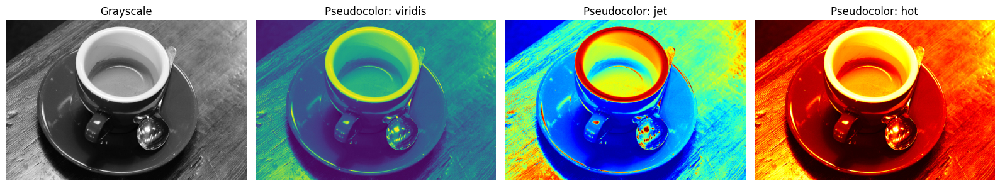

In [7]:
gray = rgb2gray(coffee)

plt.figure(figsize=(16, 5))

plt.subplot(1, 4, 1)
plt.imshow(gray, cmap="gray")
plt.title("Grayscale")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(gray, cmap="viridis")
plt.title("Pseudocolor: viridis")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(gray, cmap="jet")
plt.title("Pseudocolor: jet")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(gray, cmap="hot")
plt.title("Pseudocolor: hot")
plt.axis("off")

plt.tight_layout()
plt.show()

### Intensity Slicing

Intensity slicing divides grayscale values into ranges and assigns each range a color.

### Task 5

Complete the intensity slicing example below. Try changing the thresholds.

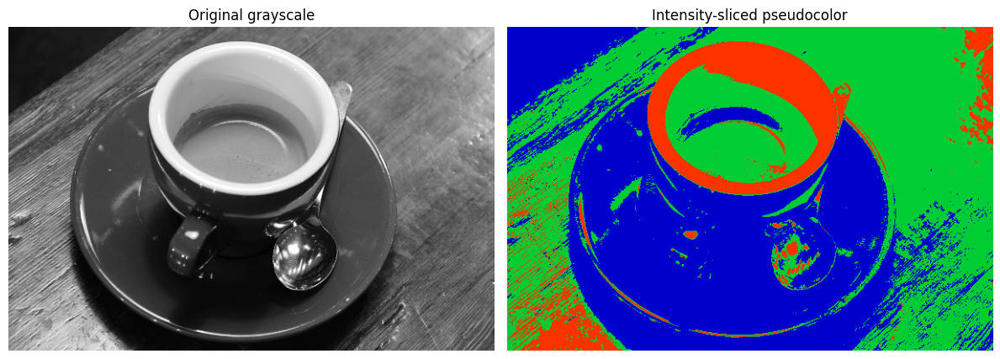

In [8]:
def intensity_slicing(gray_image):
    output = np.zeros((*gray_image.shape, 3), dtype=float)

    # Low intensity range
    output[gray_image < 0.33] = [0.0, 0.0, 0.8]       # blue

    # Medium intensity range
    output[(gray_image >= 0.33) & (gray_image < 0.66)] = [0.0, 0.8, 0.2]  # green

    # High intensity range
    output[gray_image >= 0.66] = [1.0, 0.2, 0.0]      # red/orange

    return output

sliced = intensity_slicing(gray)

show_images(
    [gray, sliced],
    ["Original grayscale", "Intensity-sliced pseudocolor"],
    cmap=None,
    figsize=(12, 5)
)

### Student tasks

1. Change the code to use **five** intensity levels instead of three.
2. Use a medical-style or thermal-style color palette.
3. Explain one advantage and one risk of pseudocolor visualisation.

## 5. Color Complements

In RGB, the complement of a normalized image can be calculated as:

$$
R_{out}=1-R_{in}, \quad G_{out}=1-G_{in}, \quad B_{out}=1-B_{in}
$$

This is similar to producing a photographic negative.

### Task 6

Create the color complement of the sample image.

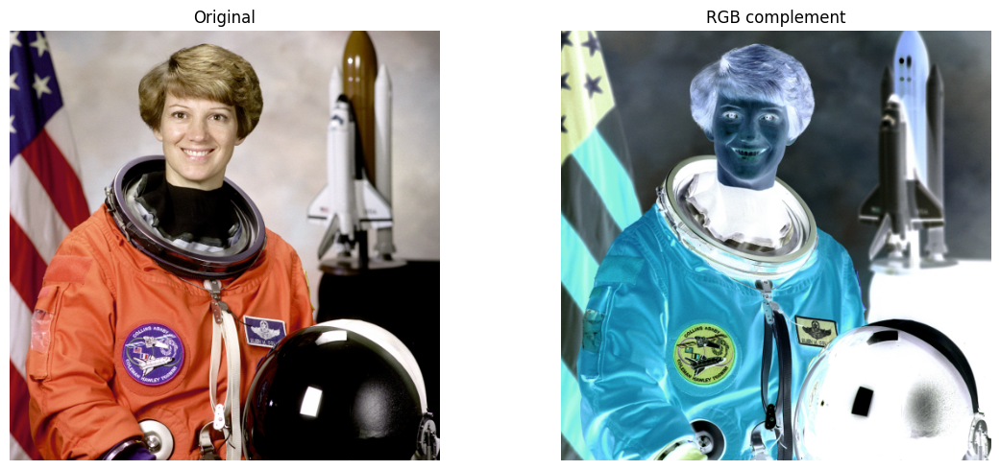

In [9]:
rgb_complement = 1 - img

show_images(
    [img, rgb_complement],
    ["Original", "RGB complement"],
    figsize=(12, 5)
)

### HSV hue complement

A hue complement can be approximated by shifting hue by 0.5 on the normalized hue circle.

### Task 7

Compare RGB complement with HSV hue complement.

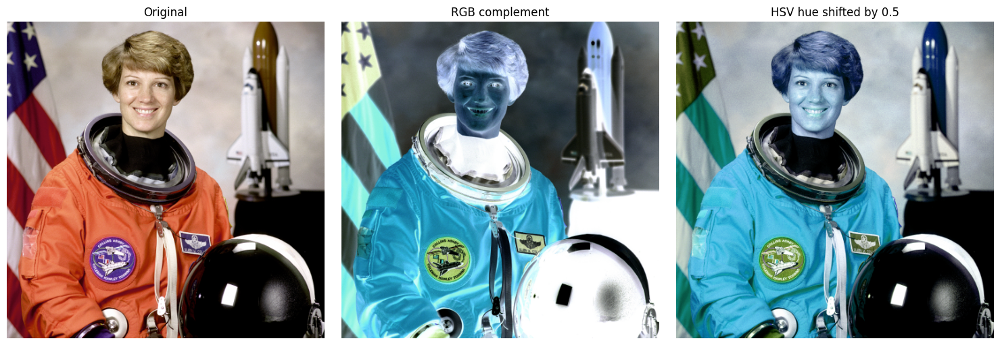

In [10]:
hsv_complement = hsv.copy()
hsv_complement[:, :, 0] = (hsv_complement[:, :, 0] + 0.5) % 1.0

rgb_from_hue_complement = hsv2rgb(hsv_complement)

show_images(
    [img, rgb_complement, rgb_from_hue_complement],
    ["Original", "RGB complement", "HSV hue shifted by 0.5"],
    figsize=(15, 5)
)

### Questions

1. How is the RGB complement visually different from hue-shift complement?
2. Which approach changes brightness more strongly?
3. Which method is closer to the lecture's RGB complement transformation?

## 6. Color Slicing

Color slicing highlights a specific range of colors.

In RGB space, we can define a target color and calculate the Euclidean distance between each pixel and the target.

### Task 8

Segment red/orange regions from the coffee image.

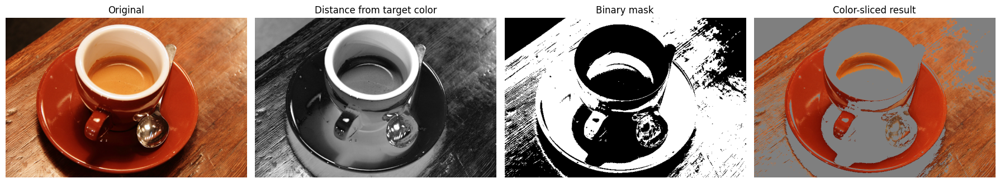

In [11]:
target_color = np.array([0.65, 0.22, 0.12])  # approximate brown/red color
distance = np.sqrt(np.sum((coffee - target_color) ** 2, axis=2))

threshold = 0.32
mask = distance < threshold

sliced_color = np.ones_like(coffee) * 0.5  # gray background
sliced_color[mask] = coffee[mask]

show_images(
    [coffee, distance, mask, sliced_color],
    ["Original", "Distance from target color", "Binary mask", "Color-sliced result"],
    cmap=None,
    figsize=(18, 5)
)

### Student tasks

1. Use the mouse or manual inspection to choose a different target color.
2. Try thresholds `0.15`, `0.25`, `0.35`, and `0.45`.
3. Report how the threshold changes false positives and false negatives.
4. Modify the code so that non-target pixels become black instead of gray.

## 7. Histogram Processing

The lecture notes that histogram processing of individual RGB components may cause undesirable color changes.  
An alternative is to process only an intensity/value channel.

### Task 9

Compare RGB channel equalisation with HSV value-channel equalisation.

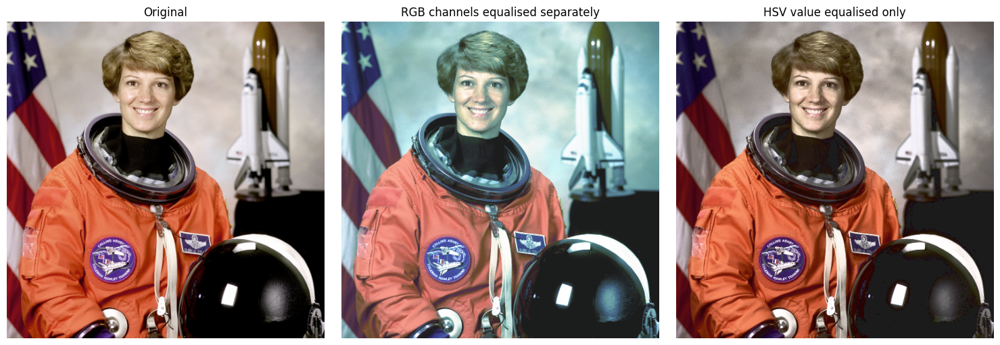

In [12]:
# Equalise each RGB channel separately
rgb_equalized = np.zeros_like(img)
for ch in range(3):
    rgb_equalized[:, :, ch] = exposure.equalize_hist(img[:, :, ch])

# Equalise only the HSV value channel
hsv_eq = rgb2hsv(img)
hsv_eq[:, :, 2] = exposure.equalize_hist(hsv_eq[:, :, 2])
value_equalized = hsv2rgb(hsv_eq)

show_images(
    [img, rgb_equalized, value_equalized],
    ["Original", "RGB channels equalised separately", "HSV value equalised only"],
    figsize=(15, 5)
)

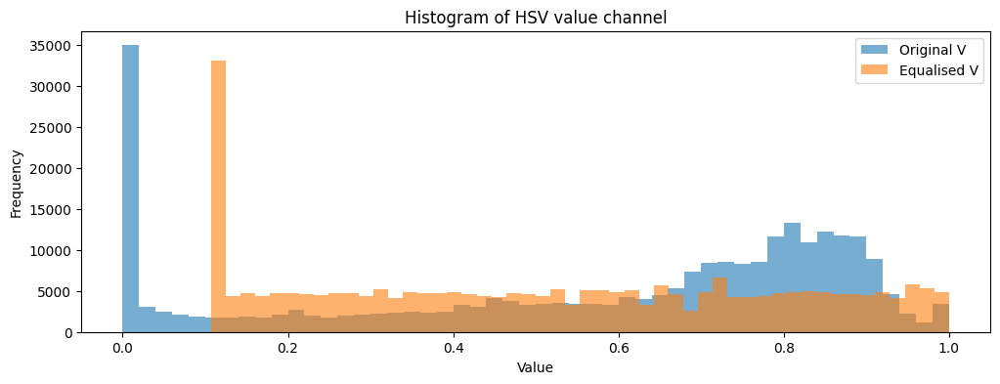

In [13]:
# Plot histograms of value/intensity-like channels
plt.figure(figsize=(12, 4))

plt.hist(rgb2hsv(img)[:, :, 2].ravel(), bins=50, alpha=0.6, label="Original V")
plt.hist(rgb2hsv(value_equalized)[:, :, 2].ravel(), bins=50, alpha=0.6, label="Equalised V")

plt.title("Histogram of HSV value channel")
plt.xlabel("Value")
plt.ylabel("Frequency")
plt.legend()
plt.show()

### Questions

1. Which result looks more natural?
2. Why can equalising R, G, and B independently shift colors?
3. In what kind of image might RGB equalisation still be acceptable?

## 8. Color Image Smoothing

Smoothing can be applied to individual RGB components or to an intensity/value channel.

### Task 10

Compare RGB smoothing and HSV value smoothing.

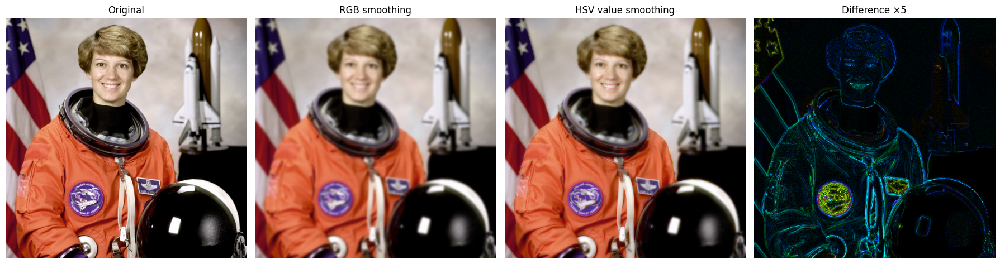

In [14]:
sigma = 2.0

# Smooth each RGB channel
rgb_smooth = np.zeros_like(img)
for ch in range(3):
    rgb_smooth[:, :, ch] = ndi.gaussian_filter(img[:, :, ch], sigma=sigma)

# Smooth only HSV value channel
hsv_smooth = rgb2hsv(img)
hsv_smooth[:, :, 2] = ndi.gaussian_filter(hsv_smooth[:, :, 2], sigma=sigma)
value_smooth = hsv2rgb(hsv_smooth)

difference = np.abs(rgb_smooth - value_smooth)

show_images(
    [img, rgb_smooth, value_smooth, difference * 5],
    ["Original", "RGB smoothing", "HSV value smoothing", "Difference ×5"],
    figsize=(18, 5)
)

### Student tasks

1. Repeat with `sigma = 0.5`, `3`, and `6`.
2. Which method preserves color better?
3. Which method removes noise more strongly?

## 9. Color Image Sharpening

Sharpening can be performed using an unsharp-mask style operation:

$$
\text{sharpened} = \text{image} + \alpha(\text{image} - \text{blurred image})
$$

### Task 11

Compare sharpening in RGB and sharpening only the HSV value channel.

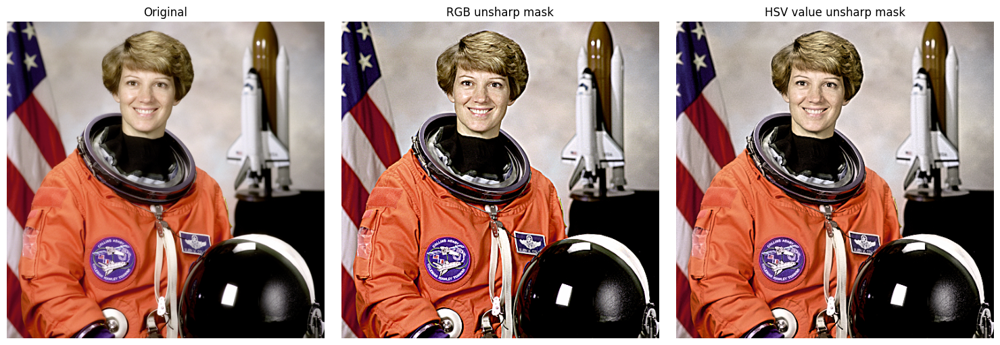

In [15]:
def unsharp_mask_rgb(image, sigma=2.0, alpha=1.5):
    blurred = np.zeros_like(image)
    for ch in range(3):
        blurred[:, :, ch] = ndi.gaussian_filter(image[:, :, ch], sigma=sigma)
    sharpened = image + alpha * (image - blurred)
    return np.clip(sharpened, 0, 1)

def unsharp_mask_hsv_value(image, sigma=2.0, alpha=1.5):
    hsv_image = rgb2hsv(image)
    V = hsv_image[:, :, 2]
    blurred_V = ndi.gaussian_filter(V, sigma=sigma)
    hsv_image[:, :, 2] = np.clip(V + alpha * (V - blurred_V), 0, 1)
    return hsv2rgb(hsv_image)

rgb_sharp = unsharp_mask_rgb(img, sigma=2, alpha=1.5)
value_sharp = unsharp_mask_hsv_value(img, sigma=2, alpha=1.5)

show_images(
    [img, rgb_sharp, value_sharp],
    ["Original", "RGB unsharp mask", "HSV value unsharp mask"],
    figsize=(15, 5)
)

### Student tasks

1. Increase `alpha` to 3.0. What artifacts appear?
2. Try `sigma = 1`, `2`, and `5`.
3. Explain why sharpening may amplify noise.

## 10. Color Image Segmentation

Color segmentation can be done using hue and saturation, or using distance in RGB space.

### Task 12

Use HSV thresholds to detect highly saturated regions.

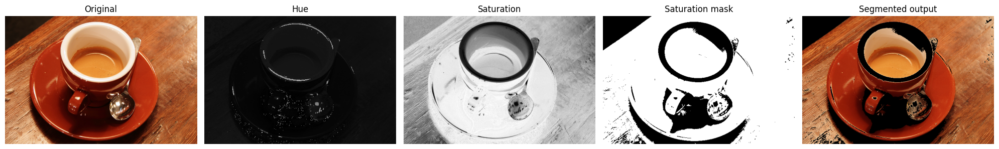

In [16]:
hsv_coffee = rgb2hsv(coffee)
Hc, Sc, Vc = hsv_coffee[:, :, 0], hsv_coffee[:, :, 1], hsv_coffee[:, :, 2]

sat_threshold = 0.35
value_threshold = 0.20

sat_mask = (Sc > sat_threshold) & (Vc > value_threshold)

segmented = np.zeros_like(coffee)
segmented[sat_mask] = coffee[sat_mask]

show_images(
    [coffee, Hc, Sc, sat_mask, segmented],
    ["Original", "Hue", "Saturation", "Saturation mask", "Segmented output"],
    cmap=None,
    figsize=(20, 5)
)

### Student tasks

1. Change the saturation threshold and observe the segmentation.
2. Combine hue and saturation thresholds to isolate a specific color.
3. Compare HSV segmentation with RGB-distance segmentation from Section 6.

## 11. Color Edge Detection

For a simple practical comparison, we can detect edges in:

1. Grayscale image.
2. Each RGB channel separately.
3. HSV value channel.

### Task 13

Apply Sobel edge detection using different representations.

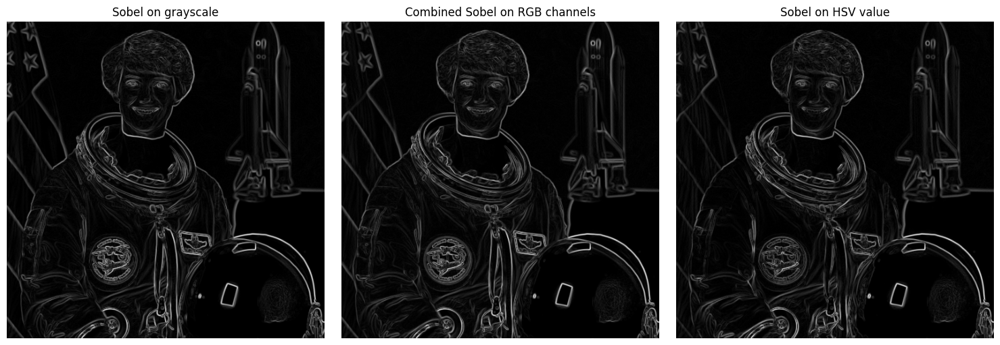

In [17]:
gray_img = rgb2gray(img)
gray_edges = filters.sobel(gray_img)

rgb_edges = np.zeros_like(gray_img)
for ch in range(3):
    rgb_edges += filters.sobel(img[:, :, ch]) ** 2
rgb_edges = np.sqrt(rgb_edges)
rgb_edges = rgb_edges / rgb_edges.max()

hsv_img = rgb2hsv(img)
value_edges = filters.sobel(hsv_img[:, :, 2])
value_edges = value_edges / value_edges.max()

show_images(
    [gray_edges, rgb_edges, value_edges],
    ["Sobel on grayscale", "Combined Sobel on RGB channels", "Sobel on HSV value"],
    cmap="gray",
    figsize=(15, 5)
)

### Questions

1. Which edge map contains the most detail?
2. Which edge map seems most robust to color variations?
3. Why is direct color edge detection more complex than grayscale edge detection?

## 12. Noise in Color Images

Noise may affect all color channels similarly, or it may affect only one channel.

### Task 14

Add Gaussian noise to all channels and then only to the blue channel.

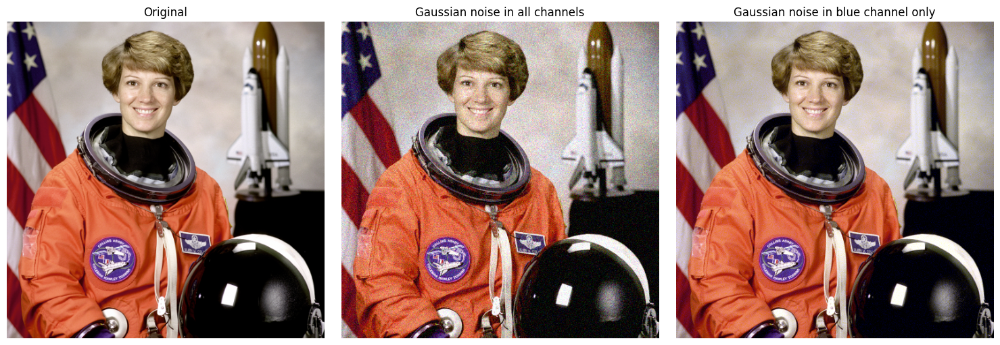

In [18]:
rng = np.random.default_rng(42)

noise_strength = 0.08

# Noise in all RGB channels
noisy_all = np.clip(img + rng.normal(0, noise_strength, img.shape), 0, 1)

# Noise only in blue channel
noisy_blue = img.copy()
noisy_blue[:, :, 2] = np.clip(
    noisy_blue[:, :, 2] + rng.normal(0, noise_strength, img[:, :, 2].shape),
    0,
    1
)

show_images(
    [img, noisy_all, noisy_blue],
    ["Original", "Gaussian noise in all channels", "Gaussian noise in blue channel only"],
    figsize=(15, 5)
)

### Student tasks

1. Convert the noisy images to HSV and inspect hue, saturation, and value.
2. Which component is most affected by noise?
3. Apply smoothing to reduce the noise and compare RGB smoothing with value-channel smoothing.

## 13. Integrated Practical Assignment

### Assignment: Build a Color-Based Object Highlighter

Choose one of the sample images or upload your own image.  
Design a pipeline that highlights a chosen object or color region.

Your pipeline should include:

1. Loading and normalising the image.
2. Visualising RGB channels.
3. Converting to HSV.
4. Choosing either:
   - RGB distance-based segmentation, or
   - HSV threshold-based segmentation.
5. Cleaning the mask using simple morphological operations.
6. Displaying:
   - original image,
   - mask,
   - highlighted result,
   - short explanation.

### Marking guide

| Criterion | Marks |
|---|---:|
| Correct image loading and normalisation | 10 |
| Correct channel visualisation | 10 |
| Appropriate color model selection | 15 |
| Segmentation implementation | 25 |
| Mask cleaning / improvement | 15 |
| Quality of final visualisation | 15 |
| Explanation and reflection | 10 |
| **Total** | **100** |

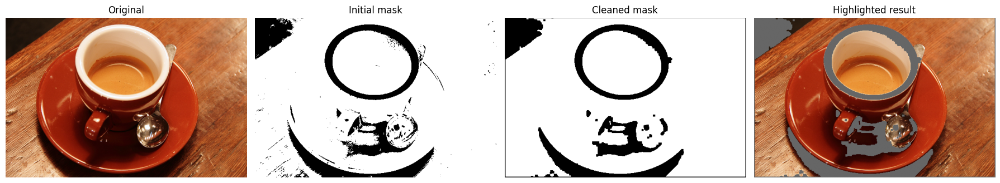

In [19]:
# Assignment starter code

# 1. Choose image
assignment_img = coffee.copy()

# 2. Convert to HSV
assignment_hsv = rgb2hsv(assignment_img)
H, S, V = assignment_hsv[:, :, 0], assignment_hsv[:, :, 1], assignment_hsv[:, :, 2]

# 3. Define thresholds
# TODO: Adjust these values
h_min, h_max = 0.00, 0.12
s_min = 0.30
v_min = 0.15

mask = (H >= h_min) & (H <= h_max) & (S >= s_min) & (V >= v_min)

# 4. Clean mask
mask_clean = ndi.binary_opening(mask, structure=np.ones((3, 3)))
mask_clean = ndi.binary_closing(mask_clean, structure=np.ones((5, 5)))

# 5. Highlight result
highlighted = np.ones_like(assignment_img) * 0.4
highlighted[mask_clean] = assignment_img[mask_clean]

show_images(
    [assignment_img, mask, mask_clean, highlighted],
    ["Original", "Initial mask", "Cleaned mask", "Highlighted result"],
    cmap=None,
    figsize=(18, 5)
)

## 14. Reflection Questions

Answer these in a markdown cell below:

1. What is the main difference between RGB and CMY?
2. Why are HSV/HSI-style models useful for human interpretation?
3. Why can pseudocolor help visual interpretation?
4. Why is it risky to equalise RGB channels independently?
5. What is the difference between color slicing and color segmentation?
6. Which method worked best for your assignment image and why?
7. What limitations did you observe?

## 15. Optional Extension Tasks

For stronger students or independent study:

1. Implement RGB-to-HSI conversion manually.
2. Implement HSI-to-RGB conversion manually.
3. Compare segmentation in RGB, HSV, Lab, and YCbCr spaces.
4. Implement Mahalanobis distance-based color segmentation using sample pixels.
5. Add a graphical interface using sliders for hue, saturation, and value thresholds.
6. Test the full pipeline on medical, satellite, or industrial inspection images.
7. Write a short report comparing color spaces for segmentation.

# **Answer to Question | Reflection Questions**

## Reflection Questions

**1. What is the main difference between RGB and CMY?**

RGB is an additive color model used for digital displays, where colors are created by adding red, green, and blue light. CMY is a subtractive color model used in printing, where colors are created by subtracting light using cyan, magenta, and yellow inks.

**2. Why are HSV/HSI-style models useful for human interpretation?**  
HSV/HSI models separate color information (hue) from brightness (intensity/value), making them more intuitive for humans. It is easier to adjust brightness or color independently compared to RGB.




**3. Why can pseudocolor help visual interpretation?**  
Pseudocolor enhances grayscale images by mapping intensity values to colors. Humans can distinguish colors better than shades of gray, so it helps reveal patterns and details that may not be visible otherwise.




**4. Why is it risky to equalise RGB channels independently?**  
Equalizing RGB channels separately can distort the natural color balance of the image, leading to unrealistic or incorrect colors because each channel is modified independently.




**5. What is the difference between color slicing and color segmentation?**  
Color slicing divides an image into ranges based on intensity or color values, usually highlighting specific ranges. Color segmentation groups pixels into meaningful regions or objects based on similarity.




**6. Which method worked best for your assignment image and why?**  
HSV-based processing worked best because it separates brightness from color, allowing more controlled manipulation. It preserved natural colors while improving visibility.



**7. What limitations did you observe?**  
Some methods, like pseudocolor, can introduce misleading visual patterns. Intensity slicing may lose fine details. Also, results depend heavily on threshold selection, which may not generalize to all images.

# **15. Optional Extension Tasks**

**RGB → HSI (manual)**

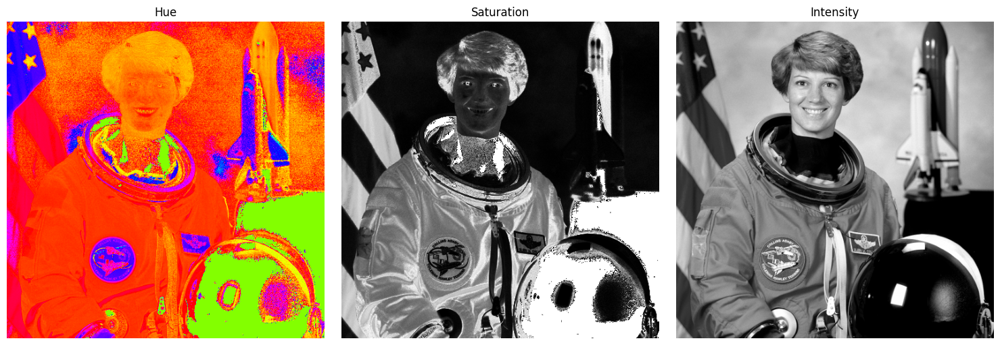

In [21]:
import numpy as np
import matplotlib.pyplot as plt

def rgb_to_hsi(image):
    # Ensure image is float for calculations
    img_float = image.copy()

    R, G, B = img_float[:,:,0], img_float[:,:,1], img_float[:,:,2]

    # Intensity
    I = (R + G + B) / 3

    # Saturation
    min_rgb = np.minimum(np.minimum(R, G), B)
    # Add a small epsilon to avoid division by zero
    S = 1 - (3 / (R + G + B + 1e-6)) * min_rgb

    # Hue
    # Add small epsilon to denominator to avoid division by zero
    num = 0.5 * ((R - G) + (R - B))
    den = np.sqrt((R - G)**2 + (R - B)*(G - B)) + 1e-6
    theta = np.arccos(num / den)

    # If B > G, then H = 2π - θ, otherwise H = θ
    H = np.where(B <= G, theta, 2*np.pi - theta)
    # Normalize Hue to [0, 1] range (skimage hsv is 0-1)
    H = H / (2*np.pi)

    return H, S, I

# Using 'img' which is the astronaut image loaded earlier in the notebook
H, S, I = rgb_to_hsi(img)

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(H, cmap='hsv')
plt.title("Hue")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(S, cmap='gray')
plt.title("Saturation")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(I, cmap='gray')
plt.title("Intensity")
plt.axis('off')

plt.tight_layout()
plt.show()

**2. HSI → RGB Conversion**

(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

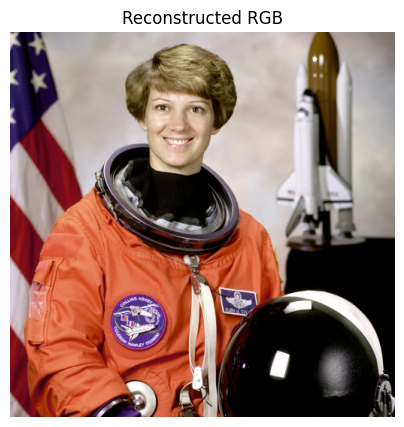

In [22]:
def hsi_to_rgb(H, S, I):
    H = H * 2 * np.pi
    R = np.zeros_like(H)
    G = np.zeros_like(H)
    B = np.zeros_like(H)

    # Region 1
    idx = (H >= 0) & (H < 2*np.pi/3)
    B[idx] = I[idx] * (1 - S[idx])
    R[idx] = I[idx] * (1 + (S[idx]*np.cos(H[idx])) / (np.cos(np.pi/3 - H[idx]) + 1e-6))
    G[idx] = 3*I[idx] - (R[idx] + B[idx])

    # Region 2
    idx = (H >= 2*np.pi/3) & (H < 4*np.pi/3)
    H2 = H - 2*np.pi/3
    R[idx] = I[idx] * (1 - S[idx])
    G[idx] = I[idx] * (1 + (S[idx]*np.cos(H2[idx])) / (np.cos(np.pi/3 - H2[idx]) + 1e-6))
    B[idx] = 3*I[idx] - (R[idx] + G[idx])

    # Region 3
    idx = (H >= 4*np.pi/3)
    H3 = H - 4*np.pi/3
    G[idx] = I[idx] * (1 - S[idx])
    B[idx] = I[idx] * (1 + (S[idx]*np.cos(H3[idx])) / (np.cos(np.pi/3 - H3[idx]) + 1e-6))
    R[idx] = 3*I[idx] - (G[idx] + B[idx])

    rgb = np.stack([R, G, B], axis=-1)
    rgb = np.clip(rgb * 255, 0, 255).astype(np.uint8)
    return rgb

rgb_reconstructed = hsi_to_rgb(H, S, I)

plt.imshow(rgb_reconstructed)
plt.title("Reconstructed RGB")
plt.axis('off')

**3. Compare Color Spaces (Simple Version)**

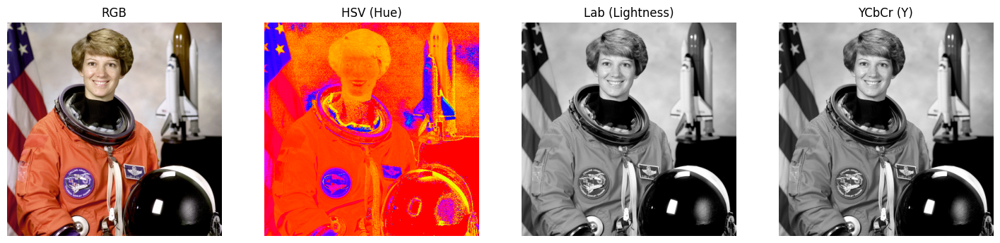

In [24]:
from skimage import color

hsv = color.rgb2hsv(img)
lab = color.rgb2lab(img)
ycbcr = color.rgb2ycbcr(img)

fig, ax = plt.subplots(1,4, figsize=(18,5))

ax[0].imshow(img)
ax[0].set_title("RGB")

ax[1].imshow(hsv[:,:,0], cmap='hsv')
ax[1].set_title("HSV (Hue)")

ax[2].imshow(lab[:,:,0], cmap='gray')
ax[2].set_title("Lab (Lightness)")

ax[3].imshow(ycbcr[:,:,0], cmap='gray')
ax[3].set_title("YCbCr (Y)")

for a in ax:
    a.axis('off')

**4. Mahalanobis Distance Segmentation**

(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

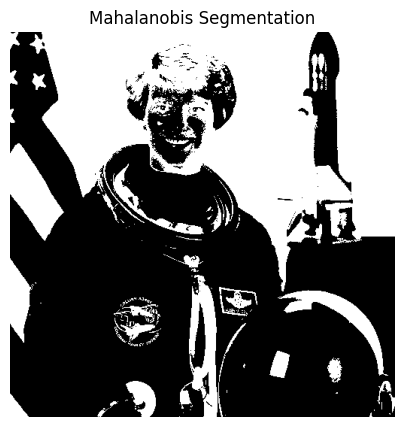

In [26]:
import numpy as np

# Select sample region manually (adjust coordinates if needed)
sample = img[100:150, 100:150]  # Changed 'image' to 'img'

# Reshape
pixels = sample.reshape(-1, 3)

# Mean and covariance
mean = np.mean(pixels, axis=0)
cov = np.cov(pixels, rowvar=False)
inv_cov = np.linalg.inv(cov)

# Compute Mahalanobis distance
h, w, _ = img.shape  # Changed 'image' to 'img'
distance = np.zeros((h, w))

for i in range(h):
    for j in range(w):
        x = img[i, j]  # Changed 'image' to 'img'
        diff = x - mean
        distance[i, j] = np.sqrt(diff.T @ inv_cov @ diff)

# Threshold
mask = distance < 20

plt.imshow(mask, cmap='gray')
plt.title("Mahalanobis Segmentation")
plt.axis('off')

### Optional Task Summary

RGB-HSI conversion was implemented manually to better understand color representation.  
HSI separates intensity from color, making it more intuitive for analysis.

Comparison of RGB, HSV, Lab, and YCbCr showed that:
- HSV is better for color-based adjustments
- Lab is useful for perceptual differences
- YCbCr separates brightness efficiently

Overall, HSV and HSI were the most useful for this assignment.

Mahalanobis distance was used to segment pixels based on similarity to a selected sample region.
It considers both mean and covariance, making it more robust than simple thresholding.
However, it is sensitive to the selected sample and computationally expensive.